<h1><center>HAPS-based MIMO Communication and Metaheuristic Optimization</center></h1>

<center><font size="5">Channel Modeling and Position Optimization for High Altitude Platform Stations</font></center>

This Jupyter Notebook demonstrates the integration of a **High Altitude Platform Station (HAPS)** with a **MIMO communication system**, focusing on both channel modeling and intelligent positioning.

We explore:
- The setup and evaluation of **MIMO-based HAPS-to-ground** channel models.
- User distributions over geographically segmented areas.
- Beamforming and capacity estimation across multiple urban and suburban environments.
- The application of **metaheuristic algorithms**—including PSO, GA, DE, and custom variants—to solve the HAPS positioning problem with the objective of **maximizing total system capacity**.

This combination of modeling and optimization provides a complete experimental workflow for evaluating the efficiency and robustness of HAPS deployments in complex wireless scenarios.


## Imports and Basic Setup
In this cell, we import fundamental libraries such as `pandas`, `numpy`, `shapely`,
and our custom environment modules (`env.ChannelModel`, `env.MIMOconfig`, etc.).
We also set up the `Area_Distribution_Scenario` and instantiate the `Milan_Map` object,
which provides us with the spatial configuration of our environment.

In [1]:
import pandas as pd 
import numpy as np
from shapely import wkt
from env.ChannelModel import MU_MIMO_CapacityCalculator
from env.MIMOconfig import MIMOConfig
from env.Map import Map
from env.haps_parameters import combined_data_sband
from env.small_scale_fading import SmallScaleFading
from env.path_loss import PathLossCalculator
from env.Directivity_Gain import DirectivityGainCalculator

Area_Distribution_Scenario = 0 

Milan_Map = Map(map_index=Area_Distribution_Scenario)

display(Milan_Map.areas_configurations)

Elevation: 10°
Dense Urban - LOS Probability: 28.2
Path Loss Parameters (S-band LOS σ_SF): 3.5
Urban - LOS Probability: 24.6
Path Loss Parameters (S-band NLOS CL): 34.3
Suburban/Rural - LOS Probability: 78.2
Path Loss Parameters (S-band LOS σ_SF): 1.79
-----
Elevation: 20°
Dense Urban - LOS Probability: 33.1
Path Loss Parameters (S-band LOS σ_SF): 3.4
Urban - LOS Probability: 38.6
Path Loss Parameters (S-band NLOS CL): 30.9
Suburban/Rural - LOS Probability: 86.9
Path Loss Parameters (S-band LOS σ_SF): 1.14
-----
Elevation: 30°
Dense Urban - LOS Probability: 39.8
Path Loss Parameters (S-band LOS σ_SF): 2.9
Urban - LOS Probability: 49.3
Path Loss Parameters (S-band NLOS CL): 29.0
Suburban/Rural - LOS Probability: 91.9
Path Loss Parameters (S-band LOS σ_SF): 1.14
-----
Elevation: 40°
Dense Urban - LOS Probability: 46.8
Path Loss Parameters (S-band LOS σ_SF): 3.0
Urban - LOS Probability: 61.3
Path Loss Parameters (S-band NLOS CL): 27.7
Suburban/Rural - LOS Probability: 92.9
Path Loss Param

,area_name,geometry,centroid,area_type
0,Agricultural Park,POLYGON ((1015456.3950162416 5676791.151211872...,POINT (1021173.7927088565 5680508.906881389),suburban_rural
1,Business,POLYGON ((1021245.0085374918 5696145.535600942...,POINT (1025304.0361819081 5698795.118986306),dense_urban
2,Duomo,POLYGON ((1026810.9830771554 5713536.431718657...,POINT (1032392.4922338607 5714332.379536502),dense_urban
3,FS,POLYGON ((1011894.1713108568 5695023.542303025...,POINT (1016392.527994784 5697165.905058188),dense_urban
4,Highway,POLYGON ((1020577.0915927321 5687169.589217605...,POINT (1024888.9876552548 5689208.820359964),suburban_rural
5,Industrial,POLYGON ((1004101.8069553276 5700353.010468131...,POINT (1008096.7972113773 5703211.344979261),urban
6,Linate,POLYGON ((1027033.622058742 5678193.6428342685...,POINT (1032396.4368542342 5681765.147206898),urban
7,Mediolanum Forum,POLYGON ((1014788.4780714819 5713536.431718657...,POINT (1020356.828082251 5715239.9585185675),urban
8,Monza Park,POLYGON ((1004101.8069553276 5688852.579164481...,POINT (1007974.4847244789 5692367.856553524),suburban_rural
9,Polimi,POLYGON ((1029705.2898377805 5689413.575813439...,POINT (1033443.4954104688 5692640.490082199),urban


## Plot MAP Function
This function creates a Map of the area configuration in (Milan) plot by:
- Converting our area configuration DataFrame into a GeoDataFrame (EPSG:3857).
- Plotting area boundaries and filling them with colors based on area type.
- Adding a basemap from OpenStreetMap (via Contextily).
- Labeling each area's centroid with its name/type.
- Adjusting the bounding box and forcing axis ticks at 5k intervals.

[1004101.80695533 5676791.15121187 1037497.65419331 5718865.89988376]


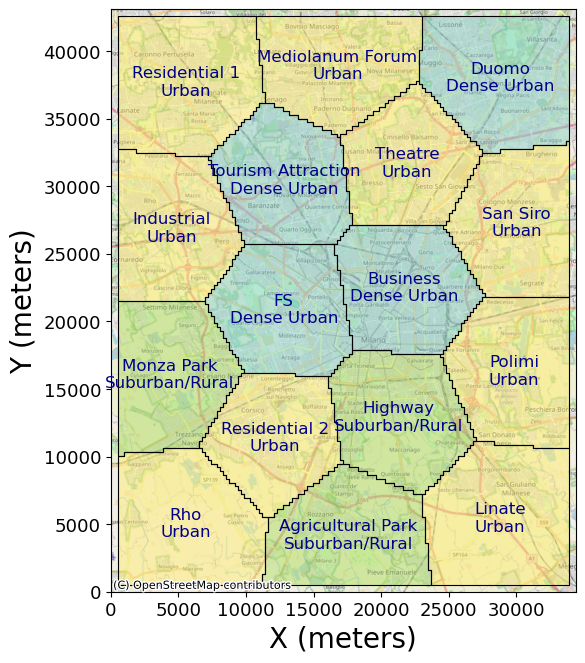

In [2]:

import geopandas as gpd
from shapely.geometry import Point



import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patches import Patch

###############################################################################
#                  HELPER: FORCE 0, 5000, 10000,... TICKS
###############################################################################
def set_5k_ticks(ax, minx, maxx, miny, maxy):
    """
    Force axis ticks labeled at 0, 5000, 10000, etc.,
    while preserving real EPSG:3857 data for the basemap.

    We do this by:
    1) computing the plot ranges,
    2) creating a list of labels [0, 5000, 10000, ...] up to that range,
    3) placing ticks at (label + minx) in the real coordinate system,
       but labeling them as the plain 'label'.
    """
    import numpy as np

    # X-axis
    x_range = maxx - minx
    x_labels = np.arange(0, x_range + 1, 5000)
    x_positions = x_labels + minx
    ax.set_xticks(x_positions)
    ax.set_xticklabels([str(int(lbl)) for lbl in x_labels], fontsize = 13)

    # Y-axis
    y_range = maxy - miny
    y_labels = np.arange(0, y_range + 1, 5000)
    y_positions = y_labels + miny
    ax.set_yticks(y_positions)
    ax.set_yticklabels([str(int(lbl)) for lbl in y_labels], fontsize = 13)



def plot_Milan_map(area_configuration=None):
    
    area_configuration_copy = area_configuration.copy()
    
    fig, ax = plt.subplots(1, 1, figsize=(6, 10))
    # Load clustered areas and remap area_type
    
    class_name_mapping = {
        'dense_urban': 'Dense Urban',
        'urban': 'Urban',
        'suburban_rural': 'Suburban/Rural'
    }
    area_configuration_copy['area_type'] = area_configuration_copy['area_type'].map(class_name_mapping).fillna('Unknown')
    
    area_configuration_copy = gpd.GeoDataFrame(area_configuration_copy, geometry='geometry', crs='EPSG:3857')

    area_configuration_copy.boundary.plot(ax=ax, edgecolor='black', linewidth=0.8)
    cmap = 'Set3'
    area_configuration_copy.plot(ax=ax, column='area_type', legend=False, cmap=cmap, alpha=0.5)

    # Basemap
    ctx.add_basemap(ax, crs=area_configuration_copy.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)


    # Label centroids
    for idx, row in area_configuration_copy.iterrows():
        centroid = row['centroid']
        area_name = row['area_name']
        ax.text(centroid.x, centroid.y, f"{area_name}\n{row['area_type']}",
                fontsize=12, ha='center', va='center', color='darkblue')


    # Determine bounding box (all polygons + HAPS)
    all_bounds = gpd.GeoSeries(
        area_configuration_copy.geometry
    ).total_bounds
    minx, miny, maxx, maxy = all_bounds
    print(all_bounds)
    # Add padding
    padding = 500
    ax.set_xlim(minx - padding, maxx + padding)
    ax.set_ylim(miny - padding, maxy + padding)

    # Force axis ticks at 0, 5000, 10000, etc.
    set_5k_ticks(ax, minx - padding, maxx + padding, miny - padding, maxy + padding)

   
    ax.set_xlabel("X (meters)", fontsize = 20)
    ax.set_ylabel("Y (meters)", fontsize = 20)
    plt.subplots_adjust(wspace=0.4, hspace=0.6)
    #plt.savefig('meeting/r_map_0.pdf', bbox_inches='tight', pad_inches=0.2, dpi=300)
    plt.show()

plot_Milan_map(Milan_Map.areas_configurations)



## Area-Specific Probabilities
We define two dictionaries:
- `area_indoor_probabilities`: Probability of a user being indoors in each area.
- `area_traditional_building_probability`: Probability of having a traditional building in each area.

These will be used later to characterize user distribution scenarios.

These probabilities are based on the area type and are used to simulate user behavior in the environment.


In [3]:
area_indoor_probabilities = {
    'Agricultural Park': 0.9,
    'Business': 0.5,
    'Duomo': 0.6,
    'FS': 0.6,
    'Highway': 0.9,
    'Industrial': 0.4,
    'Linate': 0.3,
    'Mediolanum Forum': 0.6,
    'Monza Park': 0.9,
    'Polimi': 0.5,
    'Residential 1': 0.7,
    'Residential 2': 0.7,
    'Rho': 0.6,
    'San Siro': 0.6,
    'Theatre': 0.6,
    'Tourism Attraction': 0.6
} 


area_traditional_building_probability = {
    'Agricultural Park': 0.9,
    'Business': 0.5,
    'Duomo': 0.6,
    'FS': 0.6,
    'Highway': 0.9,
    'Industrial': 0.4,
    'Linate': 0.3,
    'Mediolanum Forum': 0.6,
    'Monza Park': 0.9,
    'Polimi': 0.5,
    'Residential 1': 0.7,
    'Residential 2': 0.7,
    'Rho': 0.6,
    'San Siro': 0.6,
    'Theatre': 0.6,
    'Tourism Attraction': 0.6
}



## Randomly Selecting Areas
We randomly pick `M` areas (from the total in `Milan_Map`), 
and gather their names, indoor probabilities, building probabilities, 
boundaries, centroids, and area types. 
We then also retrieve the overall map boundaries.

In [4]:
import random   
M = 4
number_of_area = len(Milan_Map)
selected_areas_indexes = random.sample(range(number_of_area), M)
selected_areas_names = Milan_Map[selected_areas_indexes].area_name.to_list()

selected_areas_user_indoor_probabilities = []
selected_areas_traditional_building_probabilities = []
for area_name in selected_areas_names:
    selected_areas_user_indoor_probabilities.append(area_indoor_probabilities[area_name])
    selected_areas_traditional_building_probabilities.append(area_traditional_building_probability[area_name])
    
    
selected_areas_boundaries = Milan_Map[selected_areas_indexes].geometry.to_list()
selected_areas_centroids = Milan_Map[selected_areas_indexes].centroid.to_list()
selected_areas_area_types = Milan_Map[selected_areas_indexes].area_type.to_list()

Map_boundaries = Milan_Map.Get_Map_Bounds()
print(Map_boundaries)

[1004101.80695533 5676791.15121187 1037497.65419331 5718865.89988376]


## Normalization and HAPS Position
Here we shift the selected areas so that (x_min, y_min) = (0, 0),
calculating new boundaries and centroids. 
Then we randomly pick a `haps_position` within the normalized map extents.

In [5]:
from shapely.affinity import translate  # Shapely for shifting geometry

# --- Offsets to normalize to (0,0) ---
x_offset = Map_boundaries[0]  # x_min
y_offset = Map_boundaries[1]  # y_min


# --- Normalize HAPS/Map Boundaries---
normalized_map_boundaries = [
    Map_boundaries[0] - x_offset,  # x_min
    Map_boundaries[1] - y_offset,  # y_min
    Map_boundaries[2] - x_offset,  # x_max
    Map_boundaries[3] - y_offset   # y_max
]

# --- Normalize selected areas’ boundaries ---
normalized_areas_boundaries = []
for boundary in selected_areas_boundaries:
    # Shift each polygon so (x_min, y_min) is now (0,0)
    shifted_boundary = translate(boundary, xoff=-x_offset, yoff=-y_offset)
    normalized_areas_boundaries.append(shifted_boundary)

# --- Normalize selected areas’ centroids ---
normalized_areas_centroids = []
for centroid in selected_areas_centroids:
    # Shift each centroid likewise
    shifted_centroid = translate(centroid, xoff=-x_offset, yoff=-y_offset)
    normalized_areas_centroids.append(shifted_centroid)
print("Normalized Centroids:", normalized_areas_centroids)
# --- Generate random HAPS position within the normalized map bounds ---
map_width = Map_boundaries[2] - Map_boundaries[0]  # (x_max - x_min)
map_height = Map_boundaries[3] - Map_boundaries[1] # (y_max - y_min)

haps_x = random.uniform(0, map_width)
haps_y = random.uniform(0, map_height)
haps_position = (haps_x, haps_y)

# For illustration:
print("Normalized Boundaries:", normalized_areas_boundaries)
print("Normalized Centroids:", normalized_areas_centroids)
print("Random HAPS position:", haps_position)

Normalized Centroids: [<POINT (5037.984 37216.347)>, <POINT (28290.685 37541.228)>, <POINT (20787.181 12417.669)>, <POINT (21202.229 22003.968)>]
Normalized Boundaries: [<POLYGON ((0 33098.802, 0 33379.301, 0 33659.799, 0 33940.297, 0 34220.796, ...>, <POLYGON ((22709.176 36745.281, 22486.537 36745.281, 22486.537 37025.779, 22...>, <POLYGON ((16475.285 10378.438, 16475.285 10658.936, 16252.646 10658.936, 16...>, <POLYGON ((17143.202 19354.384, 17143.202 19634.883, 16920.563 19634.883, 16...>]
Normalized Centroids: [<POINT (5037.984 37216.347)>, <POINT (28290.685 37541.228)>, <POINT (20787.181 12417.669)>, <POINT (21202.229 22003.968)>]
Random HAPS position: (8845.825256650758, 11802.381697289973)


## Building the `area_parameters` List
We loop over each selected area, storing critical information:
- Name, type, boundary, centroid, altitude, and more.
- We compute the elevation angle to the HAPS at 20 km altitude.
- We also find the S-Band data entry whose elevation is closest to our computed angle.
Finally, we store everything in `area_parameters`.


In order to run the method `Haps_channel_MU_MIMO.generate_capacities( .... )` which will be later used to calculate the capacities for the MU-MIMO channel, we need to create a `area_parameters` List.

In [6]:
import numpy as np

# List to store parameters for each selected area
area_parameters = []


##This variable is intended for Monte Carlo simulations where the channel quality for every beam
##is calculated based on the average throughput of all users in the beam. A higher number of users 
##per area results in a more accurate channel estimation.
Number_users_per_beam = 500

for i, (area_name, area_type, indoor_prob, building_prob, boundary, centroid) in enumerate(
    zip(
        selected_areas_names,
        selected_areas_area_types,
        selected_areas_user_indoor_probabilities,
        selected_areas_traditional_building_probabilities,
        normalized_areas_boundaries,
        normalized_areas_centroids
    )
):
    # Initialize a dict for this area
    area_dict = {}
    
    # Basic info
    area_dict["area_name"] = area_name
    area_dict["area_type"] = area_type
    area_dict["indoor_percentage"] = indoor_prob
    area_dict["traditional_building_percentage"] = building_prob
    area_dict["boundary"] = boundary  # Shapely Polygon (already normalized)
    area_dict["beam_radius"] = Milan_Map.get_max_distance_by_index(selected_areas_indexes[i])
    # Convert centroid to a tuple (x, y, z=0).
    # If 'centroid' is a Shapely Point, we can do centroid.x, centroid.y.
    # If it's already a tuple, just use centroid[0], centroid[1].
    area_centroid = (centroid.x, centroid.y, 0)
    area_dict["area_centroid"] = area_centroid  # Storing the 3D coords
    
    # Set the altitude for the HAPS (z=20,000 as an example)
    haps_altitude = MIMOConfig.H
    haps_coordinate = (haps_position[0], haps_position[1], haps_altitude)
    
    # Compute horizontal distance in X-Y plane
    horizontal_distance = np.sqrt(
        (haps_coordinate[0] - area_centroid[0])**2 +
        (haps_coordinate[1] - area_centroid[1])**2
    )
    
    # Height difference
    height_difference = haps_coordinate[2] - area_centroid[2]
    
    # Calculate elevation angle (degrees)
    elevation_angle_rad = np.arctan2(height_difference, horizontal_distance)
    elevation_angle_deg = np.degrees(elevation_angle_rad)
    area_dict["elevation_angle_deg"] = elevation_angle_deg
    
    ##This  is intended for Monte Carlo simulations where the channel quality for every beam
    ##is calculated based on the average throughput of all users in the beam. A higher number of users 
    ##per area results in a more accurate channel estimation.

    area_dict["N_users"] = 500
        
    # Find the dataset entry whose elevation is closest to this angle
    # (Requires 'combined_data_sband' to be defined)
    closest_data = min(
        combined_data_sband.data,
        key=lambda d: abs(d.elevation - elevation_angle_deg)
    )
    area_dict["SBAND_data"] = closest_data
    
    # Finally, append this dictionary to the area parameters list
    area_parameters.append(area_dict)

# Optional: print or inspect the results
print("Final area parameters:")
for ap in area_parameters:
    print(ap)


Final area parameters:
{'area_name': 'Residential 1', 'area_type': 'urban', 'indoor_percentage': 0.7, 'traditional_building_percentage': 0.7, 'boundary': <POLYGON ((0 33098.802, 0 33379.301, 0 33659.799, 0 33940.297, 0 34220.796, ...>, 'beam_radius': 7118.955654630307, 'area_centroid': (5037.984329141909, 37216.34705977794, 0), 'elevation_angle_deg': 37.89295269965758, 'N_users': 500, 'SBAND_data': ElevationDataSBand(elevation=40, dense_urban=ScenarioDataSBand(los_probability=46.8, path_loss=PathLossParametersSBand(los_sf=3.0, nlos_sf=11.7, nlos_cl=27.7)), urban=ScenarioDataSBand(los_probability=61.3, path_loss=PathLossParametersSBand(los_sf=4, nlos_sf=6, nlos_cl=27.7)), suburban_rural=ScenarioDataSBand(los_probability=92.9, path_loss=PathLossParametersSBand(los_sf=0.92, nlos_sf=10.25, nlos_cl=18.28)))}
{'area_name': 'Duomo', 'area_type': 'dense_urban', 'indoor_percentage': 0.6, 'traditional_building_percentage': 0.6, 'boundary': <POLYGON ((22709.176 36745.281, 22486.537 36745.281, 224

## Final Plot with HAPS on Selected Areas
Finally, we:
1. Define a helper function `generate_heatmap` that includes the HAPS point.
2. Pass the *unnormalized* HAPS position to show it on the chosen subset of areas (`selected_areas_indexes`).
3. Display the resulting map with the red HAPS marker.

combined bounds: [1004101.80695533 5683523.11099937 1037497.65419331 5718865.89988376]


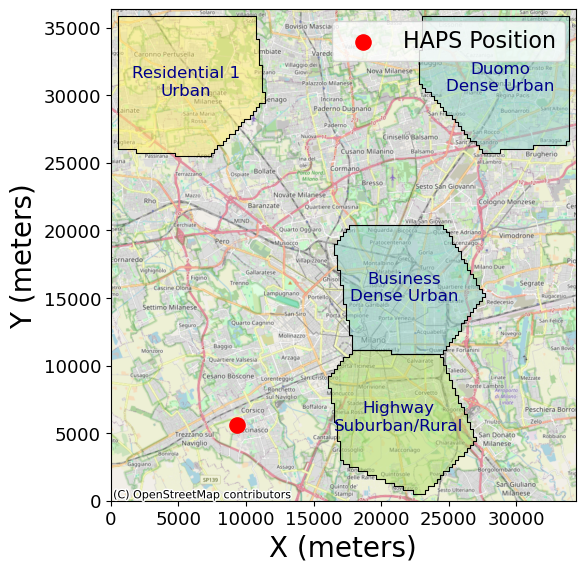

In [7]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from shapely import wkt
import numpy as np
from sklearn.neighbors import KernelDensity
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patches import Patch

###############################################################################
#                  HELPER: FORCE 0, 5000, 10000,... TICKS
###############################################################################
def set_5k_ticks(ax, minx, maxx, miny, maxy):
    """
    Force axis ticks labeled at 0, 5000, 10000, etc.,
    while preserving real EPSG:3857 data for the basemap.

    We do this by:
    1) computing the plot ranges,
    2) creating a list of labels [0, 5000, 10000, ...] up to that range,
    3) placing ticks at (label + minx) in the real coordinate system,
       but labeling them as the plain 'label'.
    """
    import numpy as np

    # X-axis
    x_range = maxx - minx
    x_labels = np.arange(0, x_range + 1, 5000)
    x_positions = x_labels + minx
    ax.set_xticks(x_positions)
    ax.set_xticklabels([str(int(lbl)) for lbl in x_labels], fontsize = 13)

    # Y-axis
    y_range = maxy - miny
    y_labels = np.arange(0, y_range + 1, 5000)
    y_positions = y_labels + miny
    ax.set_yticks(y_positions)
    ax.set_yticklabels([str(int(lbl)) for lbl in y_labels], fontsize = 13)



def generate_heatmap(selected_area_configuration, haps_position):
    area_configuration_copy = selected_area_configuration.copy()
    
    fig, ax = plt.subplots(1, 1, figsize=(6, 10))
    # Map area_type to readable form
    class_name_mapping = {
        'dense_urban': 'Dense Urban',
        'urban': 'Urban',
        'suburban_rural': 'Suburban/Rural'
    }
    area_configuration_copy['area_type'] = area_configuration_copy['area_type'].map(class_name_mapping).fillna('Unknown')
    
    # Convert to GeoDataFrame
    area_configuration_copy = gpd.GeoDataFrame(area_configuration_copy, geometry='geometry', crs='EPSG:3857')

    # Plot boundaries & fill
    area_configuration_copy.boundary.plot(ax=ax, edgecolor='black', linewidth=0.8)
    area_configuration_copy.plot(ax=ax, column='area_type', legend=False, cmap='Set3', alpha=0.5)

    # Basemap
    ctx.add_basemap(ax, crs=area_configuration_copy.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

    # Create the HAPS point
    x_val, y_val = haps_position
    haps_point = Point(x_val, y_val)
    haps_gdf = gpd.GeoDataFrame(geometry=[haps_point], crs='EPSG:3857')
    
    # Plot the HAPS point
    haps_gdf.plot(ax=ax, color='red', markersize=120, alpha=1.0, label='HAPS Position')

    # Label area centroids
    for idx, row in area_configuration_copy.iterrows():
        centroid = row['centroid']
        area_name = row['area_name']
        ax.text(
            centroid.x, centroid.y, f"{area_name}\n{row['area_type']}",
            fontsize=12, ha='center', va='center', color='darkblue'
        )

    # -------- Ensure bounding box includes polygons AND the HAPS point ----------
    combined = gpd.GeoSeries(list(area_configuration_copy.geometry) + [haps_point])
    all_bounds = combined.total_bounds  # includes the point
    minx, miny, maxx, maxy = all_bounds
    print("combined bounds:", all_bounds)
    padding = 500
    ax.set_xlim(minx - padding, maxx + padding)
    ax.set_ylim(miny - padding, maxy + padding)

    # Force axis ticks at increments of 5k
    set_5k_ticks(ax, minx - padding, maxx + padding, miny - padding, maxy + padding)

    ax.set_xlabel("X (meters)", fontsize=20)
    ax.set_ylabel("Y (meters)", fontsize=20)
    plt.subplots_adjust(wspace=0.4, hspace=0.6)
    
    # Show legend and final plot
    ax.legend(fontsize=16, loc='upper right')
    plt.show()


## we fix haps position (unnormalized) to be the same as the one used in the map
haps_position_unormalized = (haps_position[0] + x_offset, haps_position[1] + y_offset)

generate_heatmap(Milan_Map.areas_configurations.loc[selected_areas_indexes], haps_position_unormalized)



## Setting Up MU-MIMO Channel Calculator
We create a `MU_MIMO_CapacityCalculator` object with the relevant submodules:
- Small-scale fading model
- Path loss calculator
- Directivity gain calculator
- Noise power, system bandwidth, etc.

In [ ]:
total_number_of_antennas = MIMOConfig.N_x * MIMOConfig.N_y
Haps_channel_MU_MIMO = MU_MIMO_CapacityCalculator(SmallScaleFading(total_number_of_antennas,1,0.15)
                                                  , PathLossCalculator(MIMOConfig.f),DirectivityGainCalculator(MIMOConfig.H,MIMOConfig.eta), 
                                                  MIMOConfig.P_n, 
                                                  MIMOConfig.B, 
                                                  MIMOConfig.N_x, 
                                                  MIMOConfig.N_y, normalized_map_boundaries)

In [153]:
capacities=Haps_channel_MU_MIMO.generate_capacities(area_parameters,haps_coordinate, M,plot=  True)

print("Beam Capacities:\n----------------")
for i, capacity in enumerate(capacities):
    area_name = area_parameters[i]["area_name"]
    print(f"Beam {i+1} covers '{area_name}' with capacity: {capacity:.2f} Mbps")

Beam Capacities:
----------------
Beam 1 covers 'Residential 1' with capacity: 3.72 Mbps
Beam 2 covers 'Duomo' with capacity: 2.13 Mbps
Beam 3 covers 'Highway' with capacity: 29.65 Mbps
Beam 4 covers 'Business' with capacity: 12.20 Mbps


## 🧠 Metaheuristic-Based HAPS Position Optimization

In this section, we explore how different **metaheuristic algorithms** can be leveraged to determine the optimal position of a High Altitude Platform Station (HAPS) to maximize the **sum-rate capacity** in a MIMO-enabled communication network.

### Objectives:
- Find the best horizontal coordinates for the HAPS that maximize network performance.
- Compare the efficiency, convergence behavior, and robustness of different optimization strategies.

### Implemented Algorithms:
- **Global PSO**: Classic Particle Swarm Optimization using global best knowledge.
- **Local PSO**: PSO where particles are influenced by their neighborhood only.
- **Genetic Algorithm (GA)**: Evolutionary algorithm using selection, crossover, and mutation.
- **Differential Evolution (DE)**: Stochastic search based on differential mutation.
- **Custom PSO Variants**:
  - `Leader`: Swarm guided by top-performing individuals.
  - `Democratic`: Each particle follows a consensus from random peers.
  - `Differential`: Integrates DE-like mutation into PSO updates.
- **Meta-PSO with Races**:
  - Particles are divided into spatial subgroups (races), each with a local leader.
  - Variants like `DLM-PSO` dynamically update these leaders to improve search efficiency.

Each optimizer interacts with a custom channel model that calculates the sum capacity given the HAPS position and beam coverage over a multi-area map.

We then visualize convergence trends and assess which strategy best adapts to the underlying spatial and user distributions.



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
import pyswarms as ps
from deap import base, creator, tools, algorithms
import inspyred
import random

class HAPSOptimizer:
    """
    HAPSOptimizer class performs optimization of High Altitude Platform Station (HAPS) positioning
    using a variety of metaheuristic techniques, including PSO, GA, DE, and custom variants.
    """

    def __init__(self, area_points, ChosenAreas, areas_boundaries, haps_boundaries, area_type_array,
                 indoor_users_array, traditional_building_percentage_array, haps_sband_parameters,
                 HAPS_Channel_model, area_names, n_areas, Dmax=5):
        """
        Initialize the optimizer with geographic and network-related parameters.

        Parameters:
            - area_points: list of centroid points for each area
            - ChosenAreas: list of areas selected for analysis
            - areas_boundaries: polygon boundaries for each area
            - haps_boundaries: tuple of HAPS movement limits (xmin, ymin, xmax, ymax)
            - area_type_array: array of area types (urban, suburban, etc.)
            - indoor_users_array: array indicating indoor user percentages
            - traditional_building_percentage_array: traditional building coverage per area
            - haps_sband_parameters: S-band parameters (e.g., gain, bandwidth) as object
            - HAPS_Channel_model: object to evaluate channel capacity
            - area_names: list of area names
            - n_areas: number of areas
            - Dmax: maximum radius of HAPS beam in km (default: 5)
        """
        self.area_points = area_points
        self.ChosenAreas = ChosenAreas
        self.areas_boundaries = areas_boundaries
        self.bounds = [(haps_boundaries[0], haps_boundaries[2]), (haps_boundaries[1], haps_boundaries[3])]
        self.area_type_array = area_type_array
        self.indoor_users_array = indoor_users_array
        self.traditional_building_percentage_array = traditional_building_percentage_array
        self.haps_sband_parameters = haps_sband_parameters
        self.HAPS_Channel_model = HAPS_Channel_model
        self.area_names = area_names
        self.n_areas = n_areas
        self.Dmax = Dmax

    def objective_function(self, haps_position, plot=False, theta=1):
        """
        Wrapper to evaluate the objective function either for a batch of positions (PSO)
        or for a single position (GA, DE, etc.).

        Parameters:
            - haps_position: single 1D point or 2D array of points
            - plot: flag to optionally plot results
            - theta: unused parameter for potential trade-off

        Returns:
            - Objective value(s): float or array of floats depending on input shape
        """
        if len(haps_position.shape) == 2:
            return np.array([self.objective_function_single(pos, plot, theta) for pos in haps_position])
        else:
            return self.objective_function_single(haps_position, plot, theta)

    def objective_function_single(self, haps_position, plot=False, theta=1):
        """
        Computes the objective value for a single HAPS position based on sum capacity over all areas.
        Penalizes solutions where minimum capacity falls below a threshold.

        Parameters:
            - haps_position: (x, y) coordinate of the HAPS
            - plot: whether to visualize the result (default: False)
            - theta: tradeoff parameter (not used currently)

        Returns:
            Objective value (negative if self.maximize is False)
        """
        # Convert normalized input position to actual coordinates in meters and add fixed altitude
        haps_position_scaled = (haps_position[0]*1e6, haps_position[1]*1e6)
        z_value = 20000
        haps_coordinate = (haps_position_scaled[0], haps_position_scaled[1], z_value)

        area_parameters = []

        # Generate parameters for each area
        for idx, (centroid, area_type, indoor_percentage, traditional_building, boundary) in enumerate(
            zip(self.area_points, self.area_type_array, self.indoor_users_array,
                self.traditional_building_percentage_array, self.areas_boundaries)):

            area_dict = {
                "area_name": self.area_names[idx],
                "area_type": area_type,
                "indoor_percentage": indoor_percentage,
                "traditional_building_percentage": traditional_building,
                "boundary": boundary,
                "beam_radius": self.Dmax * 1e3,
                "area_centroid": (centroid.x, centroid.y, 0)
            }

            # Calculate elevation angle between HAPS and area centroid
            horizontal_distance = np.linalg.norm(np.array(haps_coordinate[:2]) - np.array([centroid.x, centroid.y]))
            elevation_angle_deg = np.degrees(np.arctan2(haps_coordinate[2], horizontal_distance))
            area_dict["elevation_angle_deg"] = elevation_angle_deg

            # Find S-band parameters corresponding to the calculated elevation angle
            closest_data = min(self.haps_sband_parameters.data, key=lambda d: abs(d.elevation - elevation_angle_deg))
            area_dict["SBAND_data"] = closest_data
            area_dict["N_users"] = 500  # Hardcoded number of users

            area_parameters.append(area_dict)

        # Compute the channel capacity for each area from the HAPS
        capacities = self.HAPS_Channel_model.generate_capacities(area_parameters, haps_coordinate, self.n_areas, plot=plot)

        # Check if minimum capacity meets constraint; apply penalty if not
        minimum_capacity = np.min(capacities)
        min_constraint = 40
        penalty = 1000 if minimum_capacity < min_constraint else 0

        # Return objective value, maximized or minimized
        if self.maximize:
            objective = np.sum(capacities)
        else:
            objective = -np.sum(capacities)
        return objective

    def run_all_optimizations(self, max_iters=50, n_repeats=5):
        """
        Executes all implemented metaheuristic optimization methods multiple times and compares their performance.

        Parameters:
            - max_iters: number of iterations for each optimization run
            - n_repeats: number of times to repeat each optimization method for averaging

        Returns:
            - Dictionary containing best score, mean cost history, and standard deviation per method
        """
        methods = {
            'PSO': self.run_pso,
            'LocalPSO': self.run_local_pso,
            'GA': self.run_ga,
            'DE': self.run_de,
            'MyPSO_democratic': lambda iters: self.run_my_pso(iters, variant='democratic'),
            'MyPSO_leader': lambda iters: self.run_my_pso(iters, variant='leader'),
            'MetaPSO_dlm': lambda iters: self.run_meta_pso(iters, variant='dlm_pso')
        }

        results = {}

        for method_name, method_func in methods.items():
            print(f"Running {method_name}...")
            best_cost = float('inf')
            histories = []

            # Decide whether the objective function should be maximized or minimized
            self.maximize = method_name in ["GA", "SteadyGA"]

            for _ in range(n_repeats):
                history = method_func(max_iters)
                # Convert minimization results to positive values for comparison
                if not self.maximize:
                    history = [-h for h in history]
                histories.append(history)

                # Track best result across all repetitions
                min_cost = np.max(history)
                if min_cost < best_cost:
                    best_cost = min_cost

            # Aggregate performance over multiple runs
            mean_history = np.mean(histories, axis=0)
            std_history = np.std(histories, axis=0)

            results[method_name] = {
                'best_score': best_cost,
                'cost_history': mean_history,
                'std_history': std_history
            }

            print(f"{method_name} best score: {best_cost}")

        # Plot the average performance with standard deviation per method
        plt.figure(figsize=(12, 8))
        for method_name, data in results.items():
            plt.plot(data['cost_history'], label=method_name)
            plt.fill_between(range(len(data["cost_history"])),
                             data["cost_history"] - data["std_history"],
                             data["cost_history"] + data["std_history"],
                             alpha=0.3)

        plt.title("Comparison of Metaheuristics")
        plt.xlabel("Iteration")
        plt.ylabel("Objective Value")
        plt.legend()
        plt.grid()
        plt.show()

        return results


    
    def optimize(self, method='PSO', n_repeats=5, max_iters=30):
        """
        Runs a selected optimization method multiple times and visualizes its average performance.

        Parameters:
            - method: name of the optimization algorithm to run (e.g., 'PSO', 'GA', 'DE')
            - n_repeats: number of repetitions to average the results
            - max_iters: number of iterations per run

        Returns:
            - mean_cost: average objective value over iterations
            - std_cost: standard deviation of objective value over iterations
        """
        methods = {
            'PSO': self.run_pso,
            'LocalPSO': self.run_local_pso,
            'GA': self.run_ga,
            'SteadyGA': self.run_steady_ga,
            'BBO': self.run_bbo,
            'MyPSO': self.run_my_pso,
            'MetaPSO': self.run_meta_pso,
            'DE': self.run_de
        }

        print(f"Running {method}...")
        if method not in methods:
            raise ValueError(f"Unknown method {method}")

        all_histories = []
        # Determine if the objective is to maximize or minimize
        self.maximize = method in ["GA", "SteadyGA"]

        # Run optimization multiple times and collect histories
        for _ in range(n_repeats):
            history = methods[method](max_iters)
            all_histories.append(history)

        # Compute average and standard deviation across runs
        mean_cost = np.mean(all_histories, axis=0)
        std_cost = np.std(all_histories, axis=0)

        # Plot convergence curve with variability
        plt.figure()
        plt.plot(mean_cost, label=f'{method} Mean')
        plt.fill_between(range(len(mean_cost)), mean_cost - std_cost, mean_cost + std_cost, alpha=0.3)
        plt.title(f"{method}: Average and Std over {n_repeats} runs")
        plt.xlabel("Iteration")
        plt.ylabel("Objective Value")
        plt.legend()
        plt.grid()
        plt.show()

        return mean_cost, std_cost
    
    def run_de(self, max_iters):
        """
        Differential Evolution (DE) optimizer.

        Applies mutation, crossover, and selection over a population of candidates to find
        the HAPS position that maximizes total capacity.

        Parameters:
            - max_iters: number of generations to run

        Returns:
            - history: list of best fitness values per generation
        """
        np.random.seed(42)
        pop_size = 30
        dim = 2
        F = 0.8  # Differential weight for mutation
        CR = 0.5  # Crossover probability
        bounds = np.array(self.bounds)

        # Initialize population within bounds
        pop = np.random.uniform(bounds[:, 0], bounds[:, 1], size=(pop_size, dim))
        fitness = np.array([self.objective_function(ind) for ind in pop])

        history = []

        for gen in range(max_iters):
            new_pop = np.copy(pop)

            for i in range(pop_size):
                # Select 3 other distinct individuals
                idxs = [idx for idx in range(pop_size) if idx != i]
                a, b, c = pop[np.random.choice(idxs, 3, replace=False)]

                # Mutation and crossover
                mutant = a + F * (b - c)
                cross_points = np.random.rand(dim) < CR
                if not np.any(cross_points):
                    cross_points[np.random.randint(0, dim)] = True
                trial = np.where(cross_points, mutant, pop[i])
                trial = np.clip(trial, bounds[:, 0], bounds[:, 1])

                # Selection step
                trial_fitness = self.objective_function(trial)
                if trial_fitness < fitness[i]:
                    new_pop[i] = trial
                    fitness[i] = trial_fitness

            pop = new_pop
            history.append(np.min(fitness))  # Track best score per generation

        return history
    
    def run_meta_pso(self, max_iters, variant='dlm_pso', n_races=4):
        """
        Meta-PSO algorithm with race-based subgroups and local leaders.

        This version of PSO divides the swarm into multiple sub-populations ("races"). Each race evolves in
        its own region of the search space and is influenced by a local leader. Two variants are supported:
        - 'alm_pso': Asynchronous Local Meta-PSO
        - 'dlm_pso': Dynamic Leader Meta-PSO

        Parameters:
            - max_iters: number of iterations
            - variant: either 'alm_pso' or 'dlm_pso'
            - n_races: number of races (sub-swarms)

        Returns:
            - cost_history: list of best global costs per iteration
        """
        np.random.seed(42)
        n_particles = 40
        dimensions = 2

        # PSO parameters
        w = 0.7  # inertia weight
        c1 = 1.5  # cognitive coefficient
        c2 = 1.5  # social (race leader) coefficient
        c3 = 1.5  # global best coefficient
        c4 = 0    # neighborhood best coefficient (unused)
        F = 0.5   # differential mutation weight (not used directly)
        k_neighbors = 5  # neighborhood size

        # Define bounds for particles
        xmin, xmax = self.bounds[0]
        ymin, ymax = self.bounds[1]

        # Divide the search space into race regions (grids)
        rows = int(np.floor(np.sqrt(n_races)))
        cols = int(np.ceil(n_races / rows))
        x_splits = np.linspace(xmin, xmax, cols + 1)
        y_splits = np.linspace(ymin, ymax, rows + 1)

        # Initialize particle positions and assign to races
        pos = np.zeros((n_particles, dimensions))
        race_assignments = np.zeros(n_particles, dtype=int)
        for i in range(n_particles):
            race_id = i * n_races // n_particles
            row = race_id // cols
            col = race_id % cols
            x_low, x_high = x_splits[col], x_splits[col + 1]
            y_low, y_high = y_splits[row], y_splits[row + 1]
            pos[i, 0] = np.random.uniform(x_low, x_high)
            pos[i, 1] = np.random.uniform(y_low, y_high)
            race_assignments[i] = race_id

        # Initialize velocity and personal bests
        vel = np.zeros((n_particles, dimensions))
        personal_best_pos = np.copy(pos)
        personal_best_cost = self.objective_function(pos)
        global_best_idx = np.argmin(personal_best_cost)
        global_best_pos = personal_best_pos[global_best_idx]
        global_best_cost = personal_best_cost[global_best_idx]
        cost_history = []

        # Identify initial race leaders
        if variant in ['alm_pso', 'dlm_pso']:
            race_leaders = []
            for race_id in range(n_races):
                race_indices = np.where(race_assignments == race_id)[0]
                if len(race_indices) > 0:
                    best_idx = race_indices[np.argmin(personal_best_cost[race_indices])]
                    race_leaders.append(best_idx)
                else:
                    race_leaders.append(0)

        # Main optimization loop
        for it in range(max_iters):
            fitness = self.objective_function(pos)

            # Update personal bests
            better_mask = fitness < personal_best_cost
            personal_best_pos[better_mask] = pos[better_mask]
            personal_best_cost[better_mask] = fitness[better_mask]

            # Update global best
            global_best_idx = np.argmin(personal_best_cost)
            global_best_pos = personal_best_pos[global_best_idx]
            global_best_cost = personal_best_cost[global_best_idx]

            # Update race leaders if using DLMPSO
            if variant == 'dlm_pso':
                race_leaders = []
                for race_id in range(n_races):
                    race_indices = np.where(race_assignments == race_id)[0]
                    if len(race_indices) > 0:
                        best_idx = race_indices[np.argmin(personal_best_cost[race_indices])]
                        race_leaders.append(best_idx)
                    else:
                        race_leaders.append(0)

            # Update particle velocities and positions
            for i in range(n_particles):
                distances = np.linalg.norm(pos - pos[i], axis=1)
                neighbors_idx = np.argsort(distances)[1:k_neighbors + 1]
                best_neighbor_idx = neighbors_idx[np.argmin(personal_best_cost[neighbors_idx])]
                best_neighbor_pos = personal_best_pos[best_neighbor_idx]

                if variant in ['alm_pso', 'dlm_pso']:
                    my_race = race_assignments[i]
                    leader_idx = race_leaders[my_race]
                    leader_pos = personal_best_pos[leader_idx]
                    vel[i] = w * vel[i]
                    vel[i] += c1 * np.random.rand() * (personal_best_pos[i] - pos[i])
                    vel[i] += c2 * np.random.rand() * (leader_pos - pos[i])
                    vel[i] += c3 * np.random.rand() * (global_best_pos - pos[i])
                    vel[i] += c4 * np.random.rand() * (best_neighbor_pos - pos[i])
                else:
                    raise ValueError(f"Unknown variant: {variant}")

            # Move particles and clip within bounds
            pos += vel
            for d in range(dimensions):
                pos[:, d] = np.clip(pos[:, d], self.bounds[d][0], self.bounds[d][1])

            cost_history.append(global_best_cost)

        return cost_history


    
def run_my_pso(self, max_iters, variant='democratic'):
        """
        Custom PSO implementation with multiple behavioral variants:
        - 'democratic': particles influenced by average of random neighbors
        - 'leader': particles influenced by best among a set of top particles
        - 'differential': particles use differential mutation inspired by DE

        Parameters:
            - max_iters: number of iterations to run
            - variant: strategy for swarm behavior ('democratic', 'leader', 'differential')

        Returns:
            - cost_history: list of best global costs per iteration
        """
        np.random.seed(42)
        n_particles = 30
        dimensions = 2

        # PSO hyperparameters
        w = 0.7    # inertia weight
        c1 = 1.5   # cognitive coefficient
        c2 = 1.5   # social/variant-specific coefficient
        c3 = 0     # neighborhood influence (optional)
        F = 0.5    # differential weight for mutation (only used in 'differential')
        k_neighbors = 3

        # Initialize positions and velocities
        pos = np.random.uniform([b[0] for b in self.bounds], [b[1] for b in self.bounds], (n_particles, dimensions))
        vel = np.zeros((n_particles, dimensions))

        # Initialize personal and global bests
        personal_best_pos = np.copy(pos)
        personal_best_cost = self.objective_function(pos)
        global_best_idx = np.argmin(personal_best_cost)
        global_best_pos = personal_best_pos[global_best_idx]
        global_best_cost = personal_best_cost[global_best_idx]
        cost_history = []

        for it in range(max_iters):
            fitness = self.objective_function(pos)

            # Update personal bests if improvement is found
            better_mask = fitness < personal_best_cost
            personal_best_pos[better_mask] = pos[better_mask]
            personal_best_cost[better_mask] = fitness[better_mask]

            # Update global best if a better solution is found
            if np.min(fitness) < global_best_cost:
                global_best_idx = np.argmin(fitness)
                global_best_pos = pos[global_best_idx]
                global_best_cost = fitness[global_best_idx]

            if variant == 'differential':
                # Use differential update rule with two random particles and neighborhood influence
                for i in range(n_particles):
                    distances = np.linalg.norm(pos - pos[i], axis=1)
                    neighbors_idx = np.argsort(distances)[1:k_neighbors + 1]
                    best_neighbor_idx = neighbors_idx[np.argmin(personal_best_cost[neighbors_idx])]
                    best_neighbor_pos = personal_best_pos[best_neighbor_idx]
                    a, b = pos[np.random.choice(n_particles, 2, replace=False)]
                    vel[i] = w * vel[i] + F * (a - b)
                    vel[i] += c1 * np.random.rand() * (personal_best_pos[i] - pos[i])
                    vel[i] += c2 * np.random.rand() * (global_best_pos - pos[i])
                    vel[i] += c3 * np.random.rand() * (best_neighbor_pos - pos[i])

            elif variant == 'leader':
                # Select top-k particles and influence each one toward a random leader from this elite set
                k = 5
                best_indices = np.argsort(personal_best_cost)[:k]
                for i in range(n_particles):
                    distances = np.linalg.norm(pos - pos[i], axis=1)
                    neighbors_idx = np.argsort(distances)[1:k_neighbors + 1]
                    best_neighbor_idx = neighbors_idx[np.argmin(personal_best_cost[neighbors_idx])]
                    best_neighbor_pos = personal_best_pos[best_neighbor_idx]
                    leader = personal_best_pos[np.random.choice(best_indices)]

                    vel[i] = w * vel[i]
                    vel[i] += c1 * np.random.rand() * (personal_best_pos[i] - pos[i])
                    vel[i] += c2 * np.random.rand() * (leader - pos[i])
                    vel[i] += c3 * np.random.rand() * (best_neighbor_pos - pos[i])

            elif variant == 'democratic':
                # Influence particle based on random average of neighbors (peer consensus)
                k = 5
                for i in range(n_particles):
                    distances = np.linalg.norm(pos - pos[i], axis=1)
                    neighbors_idx = np.argsort(distances)[1:k_neighbors + 1]
                    best_neighbor_idx = neighbors_idx[np.argmin(personal_best_cost[neighbors_idx])]
                    best_neighbor_pos = personal_best_pos[best_neighbor_idx]
                    neighbors_idx = np.random.choice(n_particles, k, replace=False)
                    avg_neighbor = np.mean(personal_best_pos[neighbors_idx], axis=0)

                    vel[i] = w * vel[i]
                    vel[i] += c1 * np.random.rand() * (personal_best_pos[i] - pos[i])
                    vel[i] += c2 * np.random.rand() * (avg_neighbor - pos[i])
                    vel[i] += c3 * np.random.rand() * (best_neighbor_pos - pos[i])

            else:
                raise ValueError(f"Unknown variant: {variant}")

            # Update positions and apply bounds
            pos += vel
            for d in range(dimensions):
                pos[:, d] = np.clip(pos[:, d], self.bounds[d][0], self.bounds[d][1])

            # Record global best cost for this iteration
            cost_history.append(global_best_cost)

        return cost_history

    
    
    def run_pso(self, max_iters):
        """
        Standard Global Best Particle Swarm Optimization (PSO) using pyswarms.

        Parameters:
            - max_iters: number of iterations

        Returns:
            - cost_history: list of best fitness per iteration
        """
        np.random.seed(42)
        options = {'c1': 1.5, 'c2': 1.3, 'w': 0.9}
        optimizer = ps.single.GlobalBestPSO(
            n_particles=30,
            dimensions=2,
            options=options,
            bounds=(np.array([b[0] for b in self.bounds]), np.array([b[1] for b in self.bounds]))
        )
        optimizer.optimize(lambda x: self.objective_function(x), iters=max_iters)
        print("cost history", optimizer.cost_history)
        return optimizer.cost_history

    def run_local_pso(self, max_iters):
        """
        Local Best Particle Swarm Optimization (PSO).

        Each particle is influenced by its local neighborhood rather than the global best.
        This can help preserve diversity and prevent premature convergence.

        Parameters:
            - max_iters: number of iterations to run

        Returns:
            - cost_history: list of best fitness values per iteration
        """
        np.random.seed(42)
        options = {'c1': 1.5, 'c2': 1.3, 'w': 0.9, 'k': 10, 'p': 2}  # 'k' is neighborhood size, 'p' is topology degree
        optimizer = ps.single.LocalBestPSO(
            n_particles=30,
            dimensions=2,
            options=options,
            bounds=(np.array([b[0] for b in self.bounds]), np.array([b[1] for b in self.bounds]))
        )
        optimizer.optimize(lambda x: self.objective_function(x), iters=max_iters)
        print("cost history", optimizer.cost_history)
        return optimizer.cost_history

    def run_ga(self, max_iters):
        """
        Classic Genetic Algorithm (GA) using DEAP.

        Uses blend crossover, Gaussian mutation, and tournament selection.

        Parameters:
            - max_iters: number of generations

        Returns:
            - List of best fitness values per generation (maximized objective)
        """
        np.random.seed(42)
        # Ensure DEAP classes are created only once
        if not hasattr(creator, "FitnessMax"):
            creator.create("FitnessMax", base.Fitness, weights=(1.0,))
        if not hasattr(creator, "Individual"):
            creator.create("Individual", list, fitness=creator.FitnessMax)

        toolbox = base.Toolbox()
        # Attribute generators for 2D position within bounds
        toolbox.register("attr_float", lambda: np.random.uniform(self.bounds[0][0], self.bounds[0][1]))
        toolbox.register("attr_float2", lambda: np.random.uniform(self.bounds[1][0], self.bounds[1][1]))

        # Structure initializers
        toolbox.register("individual", tools.initCycle, creator.Individual,
                         (toolbox.attr_float, toolbox.attr_float2), n=1)
        toolbox.register("population", tools.initRepeat, list, toolbox.individual)

        # Register evolutionary operators
        toolbox.register("evaluate", lambda ind: (self.objective_function(np.array(ind)),))
        toolbox.register("mate", tools.cxBlend, alpha=0.3)
        toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=0.005, indpb=0.3)
        toolbox.register("select", tools.selTournament, tournsize=5)

        # Initialize statistics and run algorithm
        pop = toolbox.population(n=30)
        hof = tools.HallOfFame(1)
        stats = tools.Statistics(lambda ind: ind.fitness.values)
        stats.register("max", np.max)  # Collect best fitness per generation

        logbook = algorithms.eaSimple(pop, toolbox, cxpb=0.3, mutpb=0.3,
                                      ngen=max_iters, stats=stats, halloffame=hof, verbose=False)[1]

        return [entry['max'] for entry in logbook]

    def run_steady_ga(self, max_iters):
        """
        Steady-State Genetic Algorithm (SSGA) using DEAP.

        This variant keeps the best individual ("stud") and generates offspring by mating and mutating it
        with other individuals. It uses steady updates rather than generational replacement.

        Parameters:
            - max_iters: number of generations

        Returns:
            - history: list of best fitness values per generation
        """
        np.random.seed(42)
        if not hasattr(creator, "FitnessMaxSS"):
            creator.create("FitnessMaxSS", base.Fitness, weights=(1.0,))
        if not hasattr(creator, "IndividualSS"):
            creator.create("IndividualSS", list, fitness=creator.FitnessMaxSS)

        toolbox = base.Toolbox()
        toolbox.register("attr_float", lambda: np.random.uniform(self.bounds[0][0], self.bounds[0][1]))
        toolbox.register("attr_float2", lambda: np.random.uniform(self.bounds[1][0], self.bounds[1][1]))
        toolbox.register("individual", tools.initRepeat, creator.IndividualSS, toolbox.attr_float, n=2)
        toolbox.register("population", tools.initRepeat, list, toolbox.individual)
        toolbox.register("evaluate", lambda ind: (self.objective_function(np.array(ind)),))
        toolbox.register("mate", tools.cxUniform, indpb=0.5)
        toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=0.005, indpb=0.3)
        toolbox.register("select", tools.selBest)

        pop = toolbox.population(n=30)
        stats = tools.Statistics(lambda ind: ind.fitness.values)
        stats.register("avg", np.max)

        history = []
        best_individual = None
        best_fitness = -np.inf

        for gen in range(max_iters):
            stud = tools.selBest(pop, 1)[0]
            offspring = []
            for _ in range(len(pop)):
                child = toolbox.clone(stud)
                mate = toolbox.clone(random.choice(pop))
                if np.random.rand() < 0.5:
                    toolbox.mate(child, mate)
                    del child.fitness.values
                if np.random.rand() < 0.3:
                    toolbox.mutate(child)
                    del child.fitness.values
                offspring.append(child)

            invalid = [ind for ind in offspring if not ind.fitness.valid]
            fitnesses = map(toolbox.evaluate, invalid)
            for ind, fit in zip(invalid, fitnesses):
                ind.fitness.values = fit

            pop[:] = offspring
            best_gen = tools.selBest(pop, 1)[0]
            if best_gen.fitness.values[0] > best_fitness:
                best_fitness = best_gen.fitness.values[0]
                best_individual = list(best_gen)

            record = stats.compile(pop)
            history.append(record['avg'])

        return history

    def generator(self, random_, args):
        """
        Helper method for generating individuals within bounds for algorithms like BBO or inspyred.

        Parameters:
            - random_: a random number generator (e.g., from inspyred)
            - args: additional arguments (unused)

        Returns:
            - A randomly generated individual [x, y] within bounds
        """
        return [
            random_.uniform(self.bounds[0][0], self.bounds[0][1]),
            random_.uniform(self.bounds[1][0], self.bounds[1][1])
        ]


In [ ]:
total_number_of_antennas = MIMOConfig.N_x * MIMOConfig.N_y
Haps_channel_MU_MIMO = MU_MIMO_CapacityCalculator(SmallScaleFading(total_number_of_antennas,1,0.15)
                                                  , PathLossCalculator(MIMOConfig.f),DirectivityGainCalculator(MIMOConfig.H,MIMOConfig.eta), 
                                                  MIMOConfig.P_n, 
                                                  MIMOConfig.B, 
                                                  MIMOConfig.N_x, 
                                                  MIMOConfig.N_y, normalized_map_boundaries)

## downscale the maps , this is an important step to make the optimization work 
normalized_map_boundaries_ds = [x / 1e6 for x in normalized_map_boundaries]

# Define the bounds for the HAPS position
haps_opts = HAPSOptimizer(
    area_points=normalized_areas_centroids,
    ChosenAreas=selected_areas_indexes,
    areas_boundaries=normalized_areas_boundaries,
    haps_boundaries=normalized_map_boundaries_ds,  # Normalized bounds
    area_type_array=selected_areas_area_types,
    indoor_users_array=selected_areas_user_indoor_probabilities,
    traditional_building_percentage_array=selected_areas_traditional_building_probabilities,
    haps_sband_parameters=combined_data_sband,
    HAPS_Channel_model=Haps_channel_MU_MIMO,
    area_names=selected_areas_names,
    n_areas=M
)

2025-04-30 15:37:51,021 - pyswarms.single.global_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9}


Running PSO...


pyswarms.single.global_best: 100%|██████████|50/50, best_cost=-189
2025-04-30 15:40:49,565 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -188.73643840783532, best pos: [0.02270882 0.01926839]
2025-04-30 15:40:49,571 - pyswarms.single.global_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9}


cost history [-145.18365117593336, -145.18365117593336, -156.46837592117828, -156.46837592117828, -156.46837592117828, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -170.0868721762055, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532, -188.73643840783532,

pyswarms.single.global_best: 100%|██████████|50/50, best_cost=-176
2025-04-30 15:43:48,940 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -176.1516860400427, best pos: [0.02120938 0.01963355]
2025-04-30 15:43:48,946 - pyswarms.single.global_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9}


cost history [-144.58359072473323, -144.58359072473323, -156.55288594951483, -156.55288594951483, -156.55288594951483, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -176.1516860400427, -

pyswarms.single.global_best: 100%|██████████|50/50, best_cost=-172
2025-04-30 15:46:48,325 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -171.73020512505963, best pos: [0.019674   0.01841726]
2025-04-30 15:46:48,330 - pyswarms.single.global_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9}


cost history [-143.43535163683862, -143.43535163683862, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -169.17381125768344, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963, -171.73020512505963,

pyswarms.single.global_best: 100%|██████████|50/50, best_cost=-185
2025-04-30 15:49:47,826 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -185.48955980404762, best pos: [0.02114367 0.02053523]
2025-04-30 15:49:47,833 - pyswarms.single.global_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9}


cost history [-147.34389136163668, -147.34389136163668, -157.79823089579918, -157.79823089579918, -157.79823089579918, -166.79388388888532, -166.79388388888532, -166.79388388888532, -166.79388388888532, -166.79388388888532, -166.79388388888532, -166.79388388888532, -166.79388388888532, -166.79388388888532, -166.79388388888532, -166.79388388888532, -166.79388388888532, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762, -185.48955980404762,

pyswarms.single.global_best: 100%|██████████|50/50, best_cost=-171
2025-04-30 15:52:47,799 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -171.3269965315257, best pos: [0.02046468 0.0201647 ]
2025-04-30 15:52:47,806 - pyswarms.single.local_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9, 'k': 10, 'p': 2}


cost history [-144.45620892451777, -144.45620892451777, -155.66589670715462, -155.66589670715462, -155.66589670715462, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -170.02092481783714, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -171.3269965315257, -1

pyswarms.single.local_best: 100%|██████████|50/50, best_cost=-174
2025-04-30 15:55:47,492 - pyswarms.single.local_best - INFO - Optimization finished | best cost: -174.03770837380068, best pos: [0.02223247 0.01850116]
2025-04-30 15:55:47,498 - pyswarms.single.local_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9, 'k': 10, 'p': 2}


cost history [-143.88219684466503, -143.88219684466503, -161.7220904930366, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -166.40882237153465, -174.03770837380068, -174.03770837380068, -174.03770837380068, -174.03770837380068, -174.03770837380068, -174.03770837380068, 

pyswarms.single.local_best: 100%|██████████|50/50, best_cost=-179
2025-04-30 15:58:48,498 - pyswarms.single.local_best - INFO - Optimization finished | best cost: -178.82722177307494, best pos: [0.02310236 0.01890677]
2025-04-30 15:58:48,507 - pyswarms.single.local_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9, 'k': 10, 'p': 2}


cost history [-146.18869183283994, -146.18869183283994, -150.27880546950263, -165.0285671835158, -165.0285671835158, -165.0285671835158, -165.0285671835158, -165.0285671835158, -165.0285671835158, -165.0285671835158, -172.48690028143182, -172.48690028143182, -172.48690028143182, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -174.8869659845102, -177.07665590229345, -177.07665590229345, -177.07665590229345, -177.07665590229345, -177.07665590229345, -177.07665590229345, -177.07665590229345, -177.07665590229345, -178.82722177307494, -178.82722177307494, -178.82722177307494, -178.82722177307494, -178.82722177307494, -178.82722177307494, -178.82722177307494, -178.82722177307494, -178.82722177307494, -178.82722177307494, -1

pyswarms.single.local_best: 100%|██████████|50/50, best_cost=-171
2025-04-30 16:01:55,171 - pyswarms.single.local_best - INFO - Optimization finished | best cost: -170.88026859913083, best pos: [0.02280301 0.01848416]
2025-04-30 16:01:55,181 - pyswarms.single.local_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9, 'k': 10, 'p': 2}


cost history [-145.4096088960021, -145.4096088960021, -168.49973487980083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -170.88026859913083, -

pyswarms.single.local_best: 100%|██████████|50/50, best_cost=-178
2025-04-30 16:04:58,618 - pyswarms.single.local_best - INFO - Optimization finished | best cost: -178.481615752405, best pos: [0.02059539 0.01948377]
2025-04-30 16:04:58,628 - pyswarms.single.local_best - INFO - Optimize for 50 iters with {'c1': 1.5, 'c2': 1.3, 'w': 0.9, 'k': 10, 'p': 2}


cost history [-143.0096361394638, -143.0096361394638, -171.01492410447204, -171.01492410447204, -171.01492410447204, -171.01492410447204, -171.01492410447204, -171.01492410447204, -171.01492410447204, -171.01492410447204, -171.01492410447204, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -176.52242005129773, -178.481615752405, -178.481615752405, -178.481615752405, -178.481615752405, -178.481615752405, -178.481615752405, -178.481615752405, -178.481615752405, -178.481615752405, -178.481615752405, 

pyswarms.single.local_best: 100%|██████████|50/50, best_cost=-173
2025-04-30 16:08:08,855 - pyswarms.single.local_best - INFO - Optimization finished | best cost: -173.23447712933284, best pos: [0.02256009 0.02054187]


cost history [-142.20682210965919, -142.20682210965919, -148.9943039317544, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -162.43017183083091, -168.01662019197016, -168.01662019197016, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -169.5840750112752, -173.23447712933284, -173.234477129332

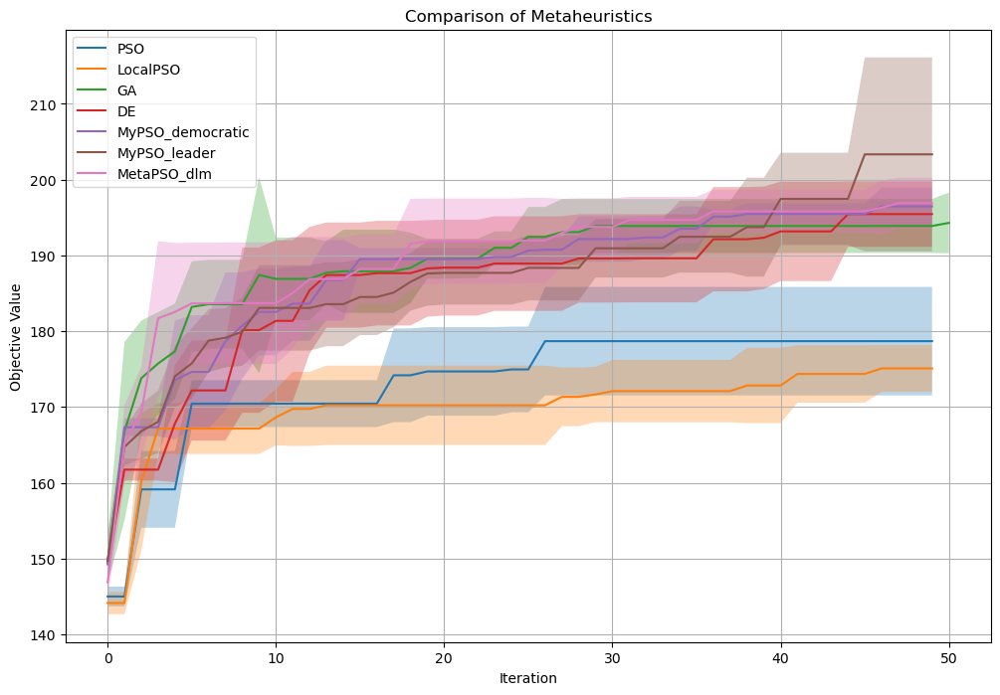

In [152]:
results_ga = haps_opts.run_all_optimizations(max_iters=50, n_repeats=5)